In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from sklearn.cluster import KMeans
import folium
import matplotlib.pyplot as plt # for data visualization
import seaborn as sns # for statistical data visualization
%matplotlib inline

In [2]:
# Load data randomly sample 20% of the data
# data = pd.read_csv('/kaggle/input/new-york-city-taxi-fare-prediction/train.csv').sample(frac=0.2, random_state=42)


data = pd.read_csv("C:/Users/EliteBook/Documents/Business Science/Semester 6/Spatial Data Analytics/Assignment 3/train.csv",nrows=11084771)


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11084771 entries, 0 to 11084770
Data columns (total 8 columns):
 #   Column             Dtype  
---  ------             -----  
 0   key                object 
 1   fare_amount        float64
 2   pickup_datetime    object 
 3   pickup_longitude   float64
 4   pickup_latitude    float64
 5   dropoff_longitude  float64
 6   dropoff_latitude   float64
 7   passenger_count    int64  
dtypes: float64(5), int64(1), object(2)
memory usage: 676.6+ MB


In [5]:
data.columns

Index(['key', 'fare_amount', 'pickup_datetime', 'pickup_longitude',
       'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
       'passenger_count'],
      dtype='object')

In [6]:
data.shape

(11084771, 8)

In [3]:
# Drop rows with missing values
data.dropna(inplace=True)

In [4]:
data.isnull().sum()

key                  0
fare_amount          0
pickup_datetime      0
pickup_longitude     0
pickup_latitude      0
dropoff_longitude    0
dropoff_latitude     0
passenger_count      0
dtype: int64

In [4]:
data = data[data['dropoff_longitude'] != 0]

In [10]:
data.describe().round(2)

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
count,10874137.00,10874137.00,10874137.00,10874137.00,10874137.00,10874137.00
mean,11.32,-73.85,40.65,-73.91,40.69,1.68
std,9.71,8.35,7.55,8.01,7.21,1.31
min,-107.75,-3439.25,-3492.26,-3426.60,-3488.08,0.00
25%,6.00,-73.99,40.74,-73.99,40.74,1.00
50%,8.50,-73.98,40.75,-73.98,40.75,1.00
75%,12.50,-73.97,40.77,-73.97,40.77,2.00
max,952.00,3457.63,3344.46,3457.62,3351.40,208.00


In [5]:
# Drop rows with negative fare_amount
data = data[data['fare_amount'] >= 0]

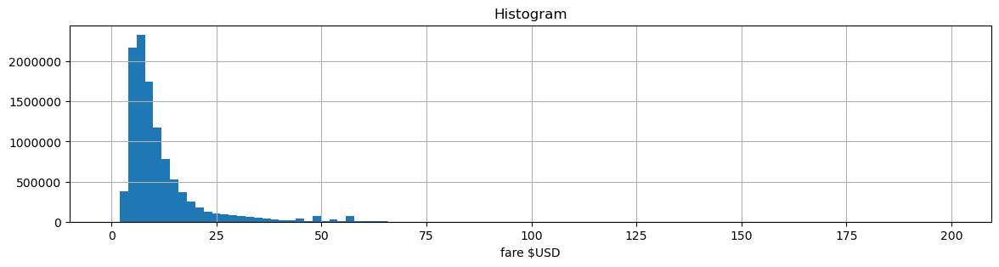

In [12]:
# plot histogram of fare
data[data.fare_amount<200].fare_amount.hist(bins=100, figsize=(14,3))
plt.xlabel('fare $USD')
plt.ticklabel_format(style='plain', axis='both')  # Disable scientific notation on both axes
plt.title('Histogram');

In [7]:
# calculate-distance-between-two-l
# return distance in kilometers
def distance(lat1, lon1, lat2, lon2):
    p = 0.017453292519943295 # Pi/180
    a = 0.5 - np.cos((lat2 - lat1) * p)/2 + np.cos(lat1 * p) * np.cos(lat2 * p) * (1 - np.cos((lon2 - lon1) * p)) / 2
    distance_in_miles = 0.6213712 * 12742 * np.arcsin(np.sqrt(a)) # 2*R*asin...
    distance_km = distance_in_miles * 1.60934
    return distance_km

# Add new column to DataFrame with distance in kilometers
data['distance_km'] = distance(data.pickup_latitude, data.pickup_longitude, \
                               data.dropoff_latitude, data.dropoff_longitude)

# Check the description for the 'distance_km' column
data.distance_km.describe().round(2)

count    10873712.00
mean           12.78
std           277.83
min             0.00
25%             1.25
50%             2.15
75%             3.92
max         19116.50
Name: distance_km, dtype: float64

C:\Users\EliteBook\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


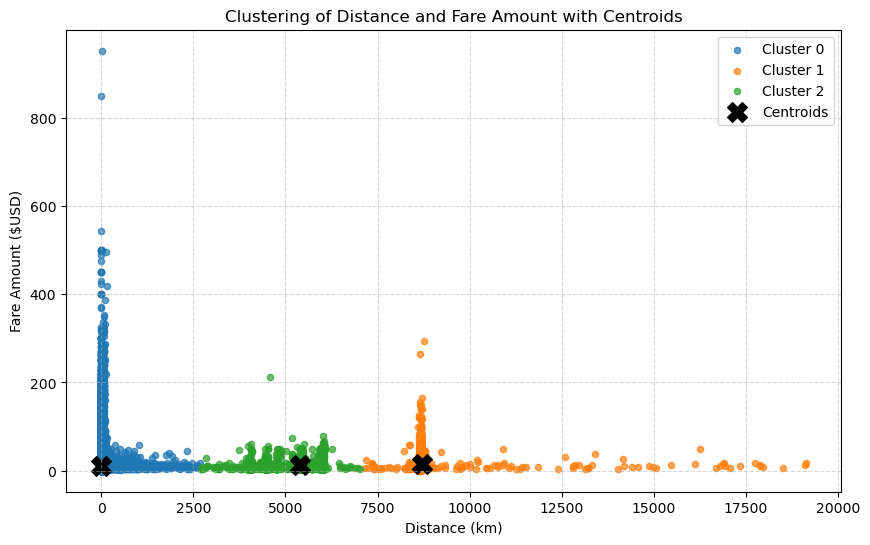

In [9]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Extract distance and fare amount columns
features = data[['distance_km', 'fare_amount']]

# Choose the number of clusters 
num_clusters = 3

# Apply K-means clustering
kmeans = KMeans(n_clusters=num_clusters, init='k-means++', random_state=42)
data['cluster'] = kmeans.fit_predict(features)

# Get cluster centroids
centroids = kmeans.cluster_centers_

# Create a scatter plot with different colors for each cluster and centroids
plt.figure(figsize=(10, 6))
for cluster in range(num_clusters):
    cluster_data = data[data['cluster'] == cluster]
    plt.scatter(cluster_data['distance_km'], cluster_data['fare_amount'], label=f'Cluster {cluster}', alpha=0.7, s=20)

# Plot centroids
plt.scatter(centroids[:, 0], centroids[:, 1], marker='X', s=200, c='black', label='Centroids')

plt.xlabel('Distance (km)')
plt.ylabel('Fare Amount ($USD)')
plt.title('Clustering of Distance and Fare Amount with Centroids')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

plt.show()


In [8]:
x = data[["distance_km", "fare_amount"]]
x.head()

,distance_km,fare_amount
0,1.030761,4.5
1,8.450113,16.9
2,1.389522,5.7
3,2.799263,7.7
4,1.999152,5.3


In [9]:
model = KMeans(n_clusters=3,n_init=10)
y_kmeans = model.fit_predict(x)

In [10]:
data['y'] = y_kmeans

In [11]:
data.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance_km,y
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21 UTC,-73.844311,40.721319,-73.841610,40.712278,1,1.030761,0
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16 UTC,-74.016048,40.711303,-73.979268,40.782004,1,8.450113,0
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00 UTC,-73.982738,40.761270,-73.991242,40.750562,2,1.389522,0
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42 UTC,-73.987130,40.733143,-73.991567,40.758092,1,2.799263,0
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00 UTC,-73.968095,40.768008,-73.956655,40.783762,1,1.999152,0


In [12]:
# Save the DataFrame to a CSV file
data.to_csv('points.csv', index=False)

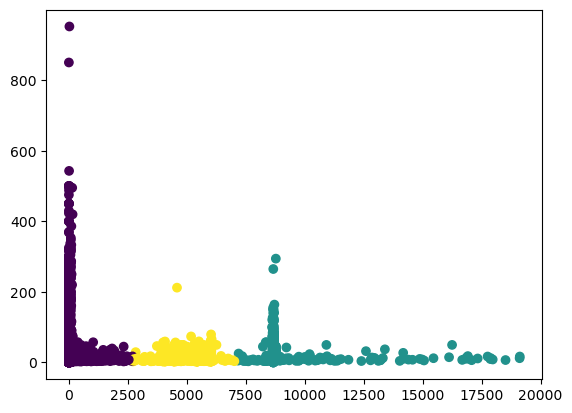

In [18]:
plt.scatter(data['distance_km'], data['fare_amount'], c=data['y'])

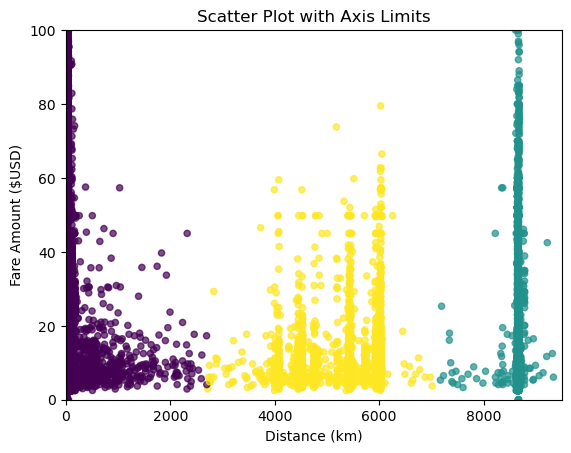

In [39]:
import matplotlib.pyplot as plt

# Assuming 'distance_km' and 'fare_amount' are columns in your DataFrame, and 'y' is the color code
plt.scatter(data['distance_km'], data['fare_amount'], c=data['y'], alpha=0.7, s=20)

# Set specific limits for x and y axes
plt.xlim(0, 9500)  # Set x-axis limits
plt.ylim(0, 100)   # Set y-axis limits

plt.xlabel('Distance (km)')
plt.ylabel('Fare Amount ($USD)')
plt.title('Scatter Plot with Axis Limits')

plt.show()


In [20]:
inertia = model.inertia_

# Print the inertia
print(f"Model Inertia: {inertia}")

Model Inertia: 5155192531.940814


In [13]:
from sklearn.metrics import calinski_harabasz_score

calinski_harabasz = calinski_harabasz_score(x, data['y'])

print(f"Calinski-Harabasz Index: {calinski_harabasz}")

Calinski-Harabasz Index: 880905355.8639324


In [14]:
from sklearn.metrics import davies_bouldin_score

davies_bouldin = davies_bouldin_score(x, data['y'])

print(f"Davies-Bouldin Index: {davies_bouldin}")


Davies-Bouldin Index: 0.1711129947467129


In [32]:
# Assuming you have labels for your clusters in 'data['cluster']'
cluster_sizes = data['y'].value_counts()

print("Cluster Sizes:")
print(cluster_sizes)


Cluster Sizes:
0    10861299
1        9978
2        2860
Name: y, dtype: int64


In [26]:
# Print metrics as a two-column table
print("Metric\t\t\tScore")
print("-----------------------------")
print(f"Calinski-Harabasz Index\t{calinski_harabasz}")
print(f"Davies-Bouldin Index\t{davies_bouldin}")
print(f"Inertia\t\t\t{inertia}")

Metric			Score
-----------------------------
Calinski-Harabasz Index	881363174.1144632
Davies-Bouldin Index	0.17110809540110097
Inertia			5155192531.940814


In [27]:

# Print metrics as a two-column table with a line in the middle
print("Metric\t\t\t| Score")
print("---------------------|---------------------")
print(f"Calinski-Harabasz Index | {calinski_harabasz}")
print(f"Davies-Bouldin Index    | {davies_bouldin}")
print(f"Inertia                 | {inertia}")

Metric			| Score
---------------------|---------------------
Calinski-Harabasz Index | 881363174.1144632
Davies-Bouldin Index    | 0.17110809540110097
Inertia                 | 5155192531.940814


In [13]:
!pip install earthengine-api


Defaulting to user installation because normal site-packages is not writeable


In [13]:
cluster1 = data[['dropoff_latitude', 'dropoff_longitude']][data['y'] == 0].sample(n=2000, random_state=42).values.tolist()
cluster2 = data[['dropoff_latitude', 'dropoff_longitude']][data['y'] == 1].sample(n=2000, random_state=42).values.tolist()
cluster3 = data[['dropoff_latitude', 'dropoff_longitude']][data['y'] == 2].sample(n=2000, random_state=42).values.tolist()

In [15]:
import folium

# Create a Folium map
map = folium.Map(location=[40.753334, -73.982093], zoom_start=10, tiles="openstreetmap")
map

In [20]:
for i in cluster1:
    folium.CircleMarker(i, radius=2,color='blue',fill_color='lightblue').add_to(map)
    
for i in cluster2:
    folium.CircleMarker(i, radius=2,color='red',fill_color='lightred').add_to(map)
    
for i in cluster3:
    folium.CircleMarker(i, radius=2,color='green',fill_color='lightgreen').add_to(map)

In [21]:
map

In [195]:
for cluster in range(3):  # Assuming 3 clusters
    cluster_data = data[data['y'] == cluster]  # Select data for each cluster
    print(f"Cluster {cluster} - Number of Coordinates:")
    print(cluster_data[['pickup_latitude', 'pickup_longitude']].count())
    print('\n')


Cluster 0 - Number of Coordinates:
pickup_latitude     10860880
pickup_longitude    10860880
dtype: int64


Cluster 1 - Number of Coordinates:
pickup_latitude     9972
pickup_longitude    9972
dtype: int64


Cluster 2 - Number of Coordinates:
pickup_latitude     2860
pickup_longitude    2860
dtype: int64




In [194]:
for cluster in range(3):  # Assuming 3 clusters
    cluster_data = data[data['y'] == cluster]  # Select data for each cluster
    print(f"Cluster {cluster} - Number of Coordinates:")
    print(cluster_data[['dropoff_latitude', 'dropoff_longitude']].count())
    print('\n')


Cluster 0 - Number of Coordinates:
dropoff_latitude     10860880
dropoff_longitude    10860880
dtype: int64


Cluster 1 - Number of Coordinates:
dropoff_latitude     9972
dropoff_longitude    9972
dtype: int64


Cluster 2 - Number of Coordinates:
dropoff_latitude     2860
dropoff_longitude    2860
dtype: int64




In [22]:
cluster1 = data[['pickup_latitude', 'pickup_longitude']][data['y'] == 0].sample(n=2000, random_state=42).values.tolist()
cluster2 = data[['pickup_latitude', 'pickup_longitude']][data['y'] == 1].sample(n=2000, random_state=42).values.tolist()
cluster3 = data[['pickup_latitude', 'pickup_longitude']][data['y'] == 2].sample(n=2000, random_state=42).values.tolist()

In [23]:
import folium

# Create a Folium map
map = folium.Map(location=[40.753334, -73.982093], zoom_start=10, tiles="openstreetmap")

In [24]:
for i in cluster1:
    folium.CircleMarker(i, radius=2,color='purple',fill_color='lightpurple').add_to(map)
    
for i in cluster2:
    folium.CircleMarker(i, radius=2,color='red',fill_color='darkred').add_to(map)
    
for i in cluster3:
    folium.CircleMarker(i, radius=2,color='pink',fill_color='lightpink').add_to(map)

In [66]:
map

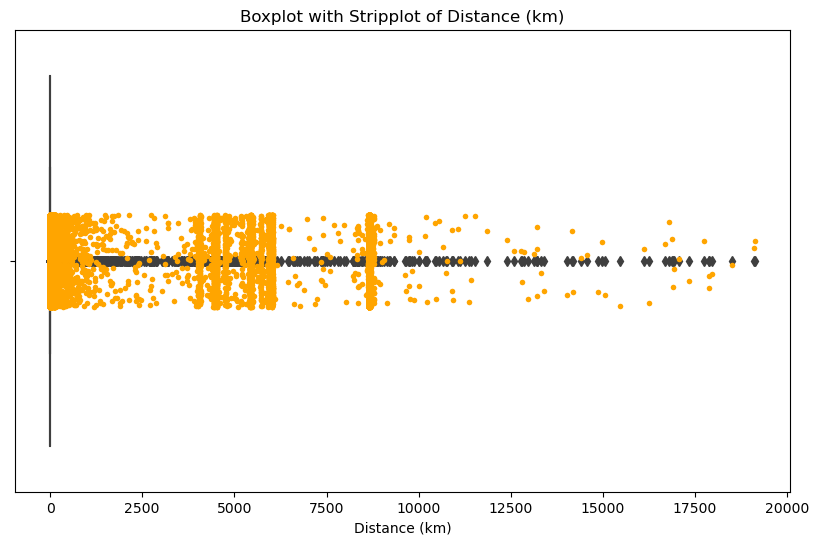

In [120]:
import seaborn as sns
import matplotlib.pyplot as plt

# Boxplot with stripplot for the 'distance_km' column
plt.figure(figsize=(10, 6))
sns.boxplot(x=data['distance_km'])
sns.stripplot(x=data['distance_km'], color='orange', size=4, jitter=True)
plt.title('Boxplot with Stripplot of Distance (km)')
plt.xlabel('Distance (km)')
plt.show()

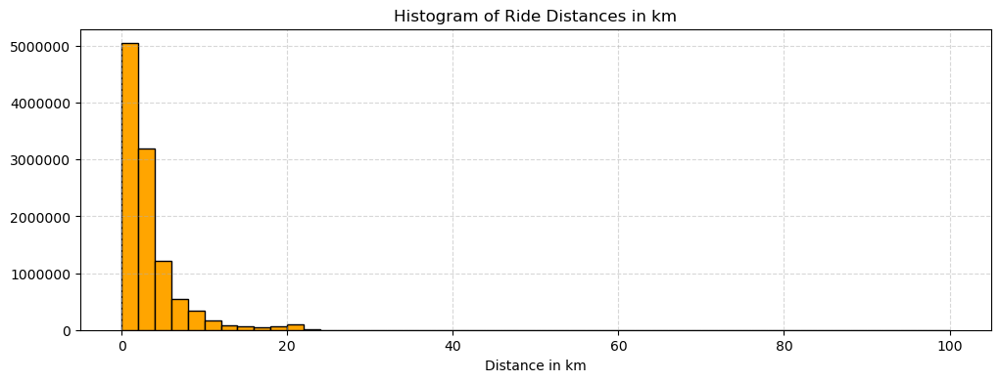

In [15]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.hist(data['distance_km'], bins=50, range=(0, 100), edgecolor='black', color='orange')  # Change color to 'skyblue'
plt.xlabel('Distance in km')

plt.title('Histogram of Ride Distances in km')
plt.grid(True, linestyle='--', alpha=0.5)  # Add grid lines
plt.ticklabel_format(style='plain', axis='both')  # Disable scientific notation on both axes
plt.show()

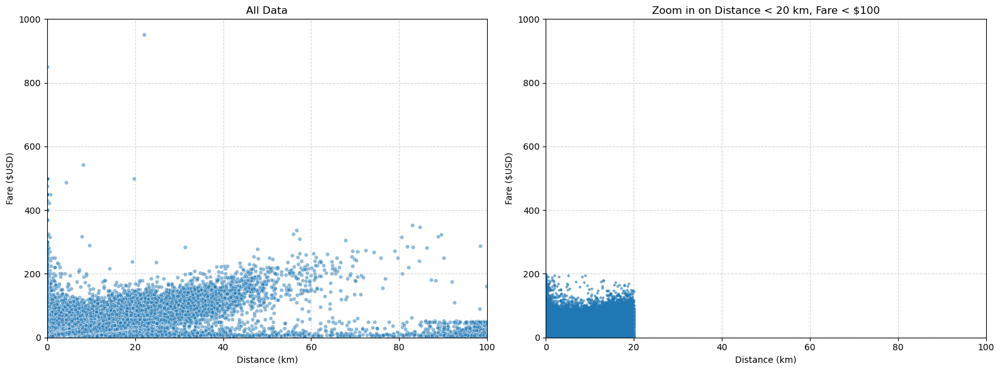

In [16]:
import matplotlib.pyplot as plt

# Create a figure and axes
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# Subplot 1: 
axs[0].scatter(data.distance_km, data.fare_amount, alpha=0.5, s=20, edgecolors='w', linewidths=0.5)
axs[0].set_xlabel('Distance (km)')
axs[0].set_ylabel('Fare ($USD)')
axs[0].set_title('All Data')
axs[0].grid(True, linestyle='--', alpha=0.5)
 
axs[0].set_xlim(0, 100)  # Set x-axis limit from 0 to 15 km
axs[0].set_ylim(0, 1000)  # Set y-axis limit from 0 to $100


# Subplot 2:
idx = (data.distance_km < 20) & (data.fare_amount < 200)
axs[1].scatter(data[idx].distance_km, data[idx].fare_amount, alpha=0.5, s=5)
axs[1].set_xlabel('Distance (km)')
axs[1].set_ylabel('Fare ($USD)')
axs[1].set_title('Zoom in on Distance < 20 km, Fare < $100')
axs[1].set_xlim(0, 100)  # Set x-axis limit from 0 to 15 km
axs[1].set_ylim(0, 1000)  # Set y-axis limit from 0 to $100
axs[1].grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


In [95]:
data

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance_km,cluster,fare_per_km,y,p
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21 UTC,-73.844311,40.721319,-73.841610,40.712278,1,1.030761,0,4.365705,0,0
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16 UTC,-74.016048,40.711303,-73.979268,40.782004,1,8.450113,0,1.999973,2,2
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00 UTC,-73.982738,40.761270,-73.991242,40.750562,2,1.389522,0,4.102131,0,0
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42 UTC,-73.987130,40.733143,-73.991567,40.758092,1,2.799263,0,2.750724,0,0
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00 UTC,-73.968095,40.768008,-73.956655,40.783762,1,1.999152,0,2.651124,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2036,2015-05-03 20:55:17.0000001,17.5,2015-05-03 20:55:17 UTC,-73.999977,40.718990,-73.981804,40.772701,2,6.165470,0,2.838389,2,2
2037,2015-06-02 09:58:13.0000001,9.0,2015-06-02 09:58:13 UTC,-73.954979,40.783501,-73.968765,40.764519,2,2.408880,0,3.736177,0,0
2038,2009-03-11 09:24:00.00000055,5.3,2009-03-11 09:24:00 UTC,-73.966072,40.758703,-73.976012,40.756935,5,0.859991,0,6.162857,0,0
2040,2010-06-05 11:32:53.0000004,6.1,2010-06-05 11:32:53 UTC,-73.976495,40.744010,-73.993073,40.747686,1,1.455159,0,4.191981,0,0


In [39]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Extract distance and fare amount columns
features = data[['distance_km', 'fare_amount']]

# Choose the number of clusters 
num_clusters = 3

# Apply K-means clustering
kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)
data['cluster'] = kmeans.fit_predict(features)

# Get cluster centroids
centroids = kmeans.cluster_centers_

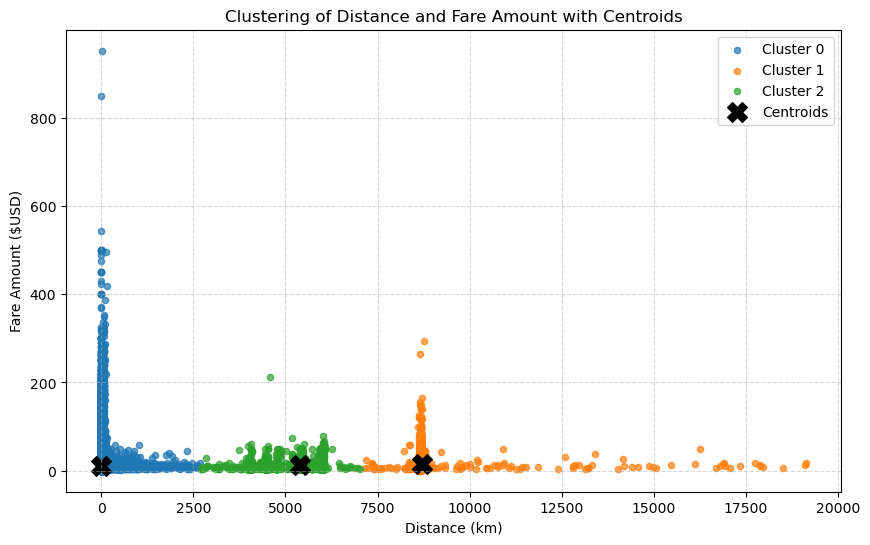

In [125]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Extract distance and fare amount columns
features = data[['distance_km', 'fare_amount']]

# Choose the number of clusters 
num_clusters = 3

# Apply K-means clustering
kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)
data['cluster'] = kmeans.fit_predict(features)

# Get cluster centroids
centroids = kmeans.cluster_centers_

# Create a scatter plot with different colors for each cluster and centroids
plt.figure(figsize=(10, 6))
for cluster in range(num_clusters):
    cluster_data = data[data['cluster'] == cluster]
    plt.scatter(cluster_data['distance_km'], cluster_data['fare_amount'], label=f'Cluster {cluster}', alpha=0.7, s=20)

# Plot centroids
plt.scatter(centroids[:, 0], centroids[:, 1], marker='X', s=200, c='black', label='Centroids')

plt.xlabel('Distance (km)')
plt.ylabel('Fare Amount ($USD)')
plt.title('Clustering of Distance and Fare Amount with Centroids')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

plt.show()


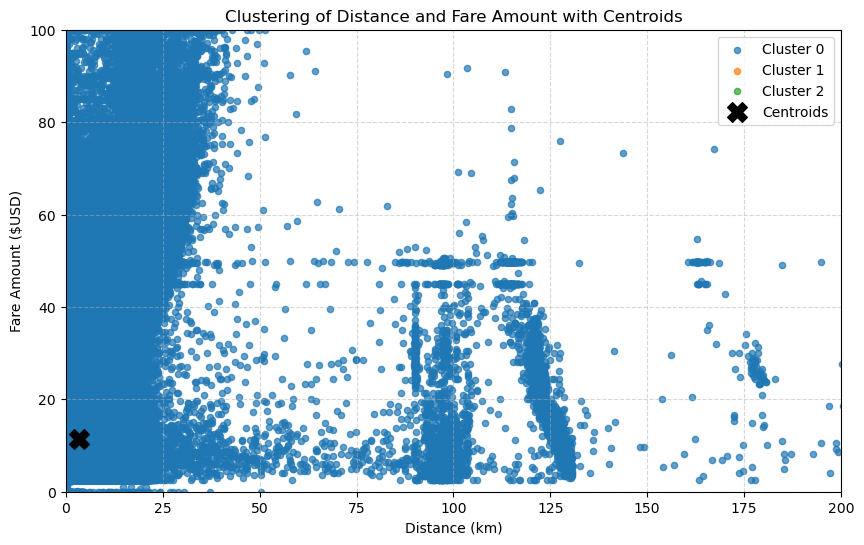

In [34]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Extract distance and fare amount columns
features = data[['distance_km', 'fare_amount']]

# Choose the number of clusters 
num_clusters = 3

# Apply K-means clustering
kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)
data['cluster'] = kmeans.fit_predict(features)

# Get cluster centroids
centroids = kmeans.cluster_centers_

# Create a scatter plot with different colors for each cluster and centroids
plt.figure(figsize=(10, 6))
for cluster in range(num_clusters):
    cluster_data = data[data['cluster'] == cluster]
    plt.scatter(cluster_data['distance_km'], cluster_data['fare_amount'], label=f'Cluster {cluster}', alpha=0.7, s=20)

# Plot centroids
plt.scatter(centroids[:, 0], centroids[:, 1], marker='X', s=200, c='black', label='Centroids')

# Set specific limits for x and y axes
plt.xlim(0, 700)  # Set x-axis limits
plt.ylim(0, 100)  # Set y-axis limits

plt.xlabel('Distance (km)')
plt.ylabel('Fare Amount ($USD)')
plt.title('Clustering of Distance and Fare Amount with Centroids')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

plt.show()


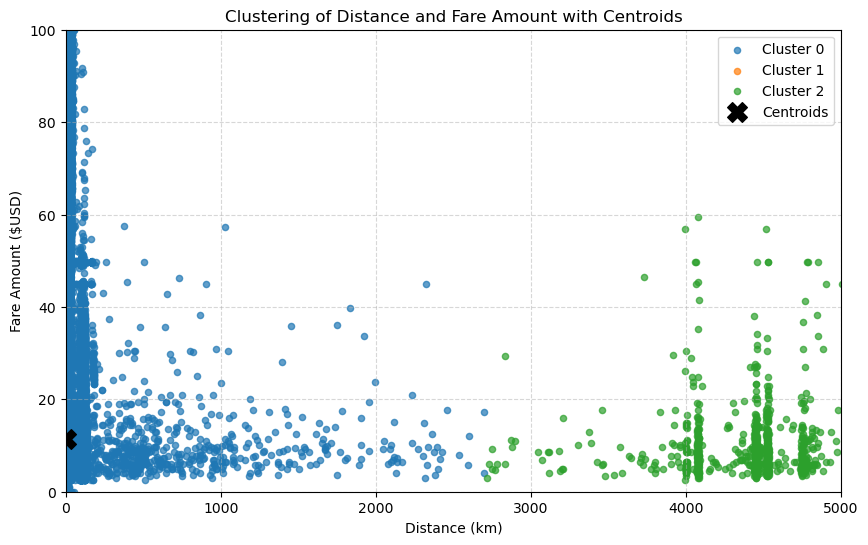

In [35]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Extract distance and fare amount columns
features = data[['distance_km', 'fare_amount']]

# Choose the number of clusters 
num_clusters = 3

# Apply K-means clustering
kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)
data['cluster'] = kmeans.fit_predict(features)

# Get cluster centroids
centroids = kmeans.cluster_centers_

# Create a scatter plot with different colors for each cluster and centroids
plt.figure(figsize=(10, 6))
for cluster in range(num_clusters):
    cluster_data = data[data['cluster'] == cluster]
    plt.scatter(cluster_data['distance_km'], cluster_data['fare_amount'], label=f'Cluster {cluster}', alpha=0.7, s=20)

# Plot centroids
plt.scatter(centroids[:, 0], centroids[:, 1], marker='X', s=200, c='black', label='Centroids')

# Set specific limits for x and y axes
plt.xlim(0, 5000)  # Set x-axis limits
plt.ylim(0, 100)  # Set y-axis limits

plt.xlabel('Distance (km)')
plt.ylabel('Fare Amount ($USD)')
plt.title('Clustering of Distance and Fare Amount with Centroids')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

plt.show()


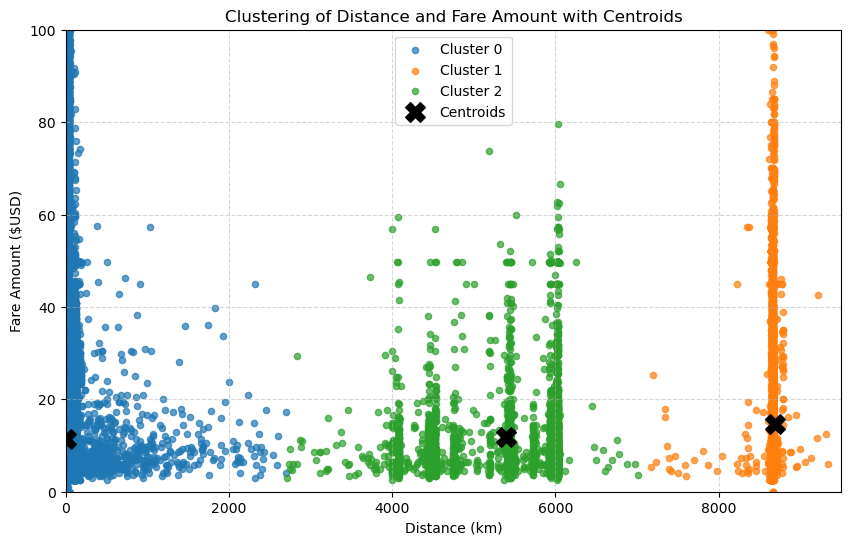

In [37]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Extract distance and fare amount columns
features = data[['distance_km', 'fare_amount']]

# Choose the number of clusters 
num_clusters = 3

# Apply K-means clustering
kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)
data['cluster'] = kmeans.fit_predict(features)

# Get cluster centroids
centroids = kmeans.cluster_centers_

# Create a scatter plot with different colors for each cluster and centroids
plt.figure(figsize=(10, 6))
for cluster in range(num_clusters):
    cluster_data = data[data['cluster'] == cluster]
    plt.scatter(cluster_data['distance_km'], cluster_data['fare_amount'], label=f'Cluster {cluster}', alpha=0.7, s=20)

# Plot centroids
plt.scatter(centroids[:, 0], centroids[:, 1], marker='X', s=200, c='black', label='Centroids')

# Set specific limits for x and y axes
plt.xlim(0, 9500)  # Set x-axis limits
plt.ylim(0, 100)  # Set y-axis limits

plt.xlabel('Distance (km)')
plt.ylabel('Fare Amount ($USD)')
plt.title('Clustering of Distance and Fare Amount with Centroids')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

plt.show()


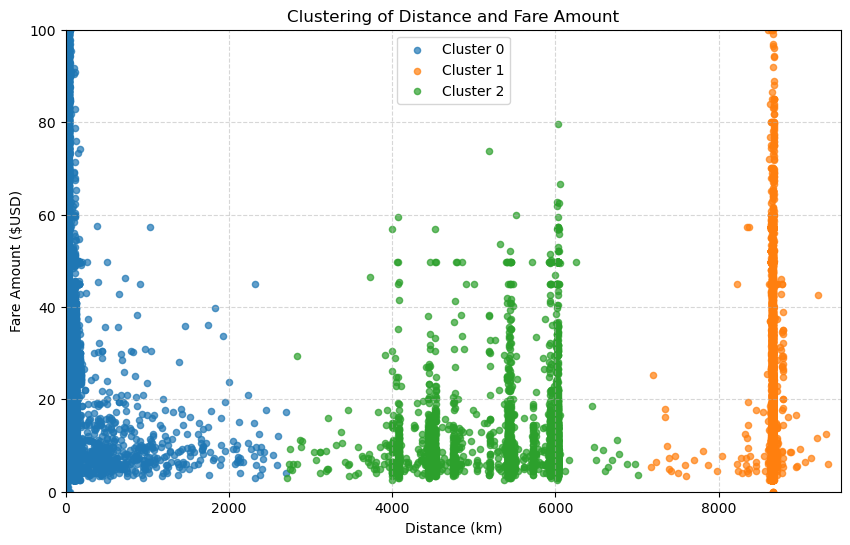

In [38]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Extract distance and fare amount columns
features = data[['distance_km', 'fare_amount']]

# Choose the number of clusters 
num_clusters = 3

# Apply K-means clustering
kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)
data['cluster'] = kmeans.fit_predict(features)

# Create a scatter plot with different colors for each cluster
plt.figure(figsize=(10, 6))
for cluster in range(num_clusters):
    cluster_data = data[data['cluster'] == cluster]
    plt.scatter(cluster_data['distance_km'], cluster_data['fare_amount'], label=f'Cluster {cluster}', alpha=0.7, s=20)

# Set specific limits for x and y axes
plt.xlim(0, 9500)  # Set x-axis limits
plt.ylim(0, 100)  # Set y-axis limits

plt.xlabel('Distance (km)')
plt.ylabel('Fare Amount ($USD)')
plt.title('Clustering of Distance and Fare Amount')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

plt.show()


In [31]:
data[['distance_km']]

,distance_km
0,1.030761
1,8.450113
2,1.389522
3,2.799263
4,1.999152
...,...
11084765,2.516353
11084766,3.195083
11084768,2.647124
11084769,3.470067


In [ ]:
from sklearn import metrics

# Silhouette Score
silhouette = metrics.silhouette_score(features, data['cluster'])


print(f"Silhouette Score: {silhouette}")

In [126]:
# Extract distance and fare amount columns
features = data[['distance_km', 'fare_amount']]
features

,distance_km,fare_amount
0,1.030761,4.5
1,8.450113,16.9
2,1.389522,5.7
3,2.799263,7.7
4,1.999152,5.3
...,...,...
11084765,2.516353,7.3
11084766,3.195083,12.5
11084768,2.647124,10.5
11084769,3.470067,11.0


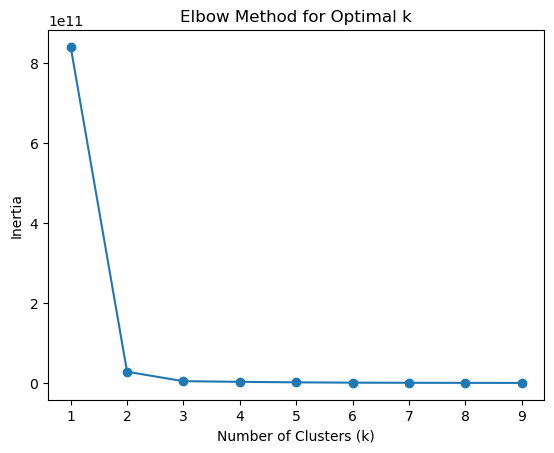

In [41]:
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans

def optimise_k_means(data, max_k):
    inertias = []
    for k in range(1, max_k):
        kmeans = KMeans(n_clusters=k, n_init=10)
        kmeans.fit(data)
        inertias.append(kmeans.inertia_)
    
    # Plot the results
    plt.plot(range(1, max_k), inertias, marker='o')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Inertia')
    plt.title('Elbow Method for Optimal k')
    plt.show()

# Example usage:
data_subset = data[['distance_km', 'fare_amount']]
result = optimise_k_means(data_subset, 10)



In [127]:
# Print centroids for each cluster
for cluster in range(num_clusters):
    centroid_x, centroid_y = centroids[cluster]
    print(f'Centroid for Cluster {cluster}: ({centroid_x:.2f}, {centroid_y:.2f})')

Centroid for Cluster 0: (3.39, 11.32)
Centroid for Cluster 1: (8692.68, 14.73)
Centroid for Cluster 2: (5398.85, 11.89)


In [128]:
# Calculate average values for fare_amount and distance_km in each cluster
cluster_means = data.groupby('cluster')[['fare_amount', 'distance_km']].median()

cluster_means

,fare_amount,distance_km
cluster,,
0,8.5,2.152323
1,9.3,8665.671657
2,8.1,5495.638169


In [174]:
# Calculate average values for fare_amount and distance_km in each cluster
cluster_means = data.groupby('cluster')[['fare_amount', 'distance_km']].mean()

cluster_means

,fare_amount,distance_km
cluster,,
0,11.322328,3.391040
1,14.733374,8692.676855
2,11.894133,5398.853632


In [40]:
# Assuming you have a 'distance_km' column in your DataFrame
data['fare_per_km'] = data['fare_amount'] / data['distance_km']

# Calculate median values for fare_per_km in each cluster
cluster_medians = data.groupby('cluster')['fare_per_km'].median()

# Convert the Series to a DataFrame
cluster_medians_df = cluster_medians.reset_index(name='Average Fare per km')

# Display the DataFrame
cluster_medians_df

,cluster,Average Fare per km
0,0,3.841821
1,1,0.001073
2,2,0.001541


In [24]:
# Calculate average values for fare_amount and distance_km in each cluster
cluster_means = data.groupby('cluster')[['fare_amount', 'distance_km']].mean()

cluster_means

,fare_amount,distance_km
cluster,,
0,11.322328,3.391040
1,14.740263,8668.006781
2,11.894133,5398.853632
3,12.883784,15316.924998


In [25]:
cluster_means = data.groupby('cluster')[['fare_amount', 'distance_km']].mean()

cluster_means

,fare_amount,distance_km
cluster,,
0,11.322328,3.391040
1,14.740263,8668.006781
2,11.894133,5398.853632
3,12.883784,15316.924998


In [179]:
# Group by cluster and calculate total passenger count and average fare amount
cluster_summary = data.groupby('cluster').agg({'passenger_count': 'sum', 'fare_amount': 'mean'})

# Rename columns for clarity
cluster_summary = cluster_summary.rename(columns={'passenger_count': 'Total_passengers', 'fare_amount': 'Average_fare'})

cluster_summary


,Total_passengers,Average_fare
cluster,,
0,18300354,11.322328
1,15404,14.733374
2,5708,11.894133


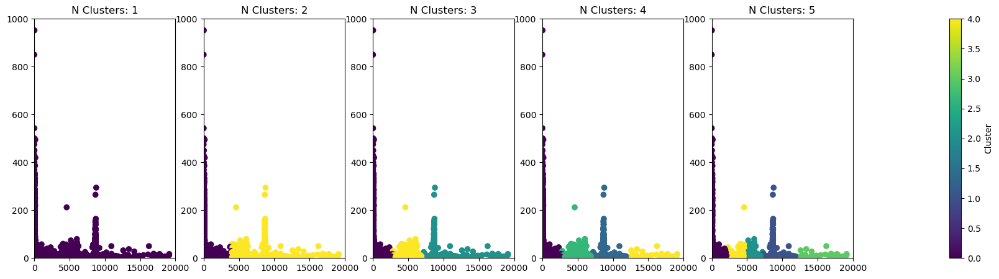

In [22]:
fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(20, 5))

# Iterate over clusters and subplot axes
for i, ax in enumerate(fig.axes, start=1):
    # Apply K-means clustering for the current number of clusters (i)
    kmeans = KMeans(n_clusters=i, n_init=10, random_state=42)
    data[f'KMeans_{i}'] = kmeans.fit_predict(features)

    # Scatter plot for the current cluster
    scatter = ax.scatter(x=data['distance_km'], y=data['fare_amount'], c=data[f'KMeans_{i}'])
    ax.set_ylim(0, 1000)  # Adjust the y-axis limits as needed
    ax.set_xlim(0, 20000)   # Adjust the x-axis limits as needed
    ax.set_title(f'N Clusters: {i}')

# Add a colorbar to the last subplot
cbar = fig.colorbar(scatter, ax=axs, orientation='vertical', fraction=0.05, pad=0.1)
cbar.set_label('Cluster')

plt.show()

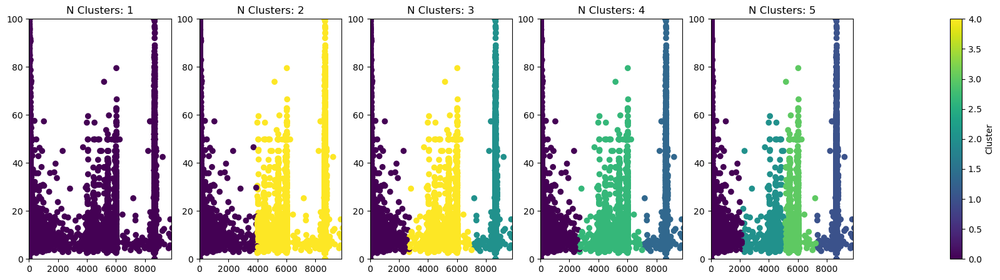

In [40]:
fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(20, 5))

# Iterate over clusters and subplot axes
for i, ax in enumerate(fig.axes, start=1):
    # Apply K-means clustering for the current number of clusters (i)
    kmeans = KMeans(n_clusters=i, n_init=10, random_state=42)
    data[f'KMeans_{i}'] = kmeans.fit_predict(features)

    # Scatter plot for the current cluster
    scatter = ax.scatter(x=data['distance_km'], y=data['fare_amount'], c=data[f'KMeans_{i}'])
    ax.set_ylim(0, 100)  # Adjust the y-axis limits as needed
    ax.set_xlim(0, 9800)   # Adjust the x-axis limits as needed
    ax.set_title(f'N Clusters: {i}')

# Add a colorbar to the last subplot
cbar = fig.colorbar(scatter, ax=axs, orientation='vertical', fraction=0.05, pad=0.1)
cbar.set_label('Cluster')

plt.show()

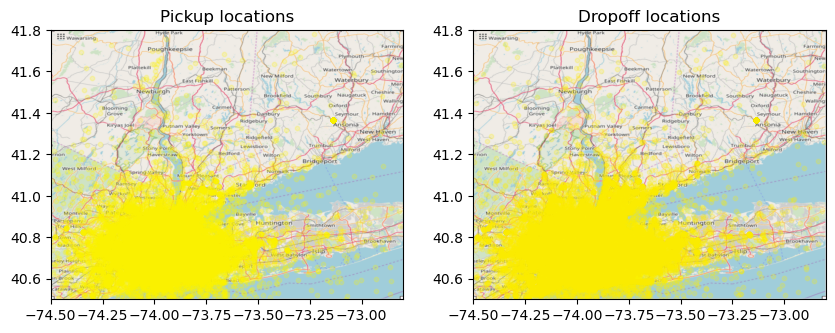

In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO
import urllib.request
import ssl

# Disable SSL certificate verification
ssl._create_default_https_context = ssl._create_unverified_context

# Define the plot_on_map function 
def plot_on_map(data, BB, nyc_map, s=10, alpha=0.2):
    fig, axs = plt.subplots(1, 2, figsize=(10, 10))

    axs[0].scatter(data.pickup_longitude, data.pickup_latitude, zorder=1, alpha=alpha, c='#fff600', s=s)
    axs[0].set_xlim((BB[0], BB[1]))
    axs[0].set_ylim((BB[2], BB[3]))
    axs[0].set_title('Pickup locations')
    axs[0].imshow(nyc_map, zorder=0, extent=BB)

    axs[1].scatter(data.dropoff_longitude, data.dropoff_latitude, zorder=1, alpha=alpha, c='#fff000', s=s)
    axs[1].set_xlim((BB[0], BB[1]))
    axs[1].set_ylim((BB[2], BB[3]))
    axs[1].set_title('Dropoff locations')
    axs[1].imshow(nyc_map, zorder=0, extent=BB)

    plt.show()

# Load the NYC map image
url_nyc_map = 'https://aiblog.nl/download/nyc_-74.5_-72.8_40.5_41.8.png'
response_nyc_map = urllib.request.urlopen(url_nyc_map)
nyc_map = np.array(Image.open(BytesIO(response_nyc_map.read())))

# Define bounding box for New York City
BB = (-74.5, -72.8, 40.5, 41.8)

# Filter data within the bounding box
selected_data = data[
    (data.pickup_longitude >= BB[0]) & (data.pickup_longitude <= BB[1]) &
    (data.pickup_latitude >= BB[2]) & (data.pickup_latitude <= BB[3]) &
    (data.dropoff_longitude >= BB[0]) & (data.dropoff_longitude <= BB[1]) &
    (data.dropoff_latitude >= BB[2]) & (data.dropoff_latitude <= BB[3])
]

# Plot pickup and dropoff locations on the map
plot_on_map(selected_data, BB, nyc_map, s=10, alpha=0.2)



# The output is a visual representation of pickup and dropoff locations on the New York City map. 
# The red dots represent the locations of taxi pickups and dropoffs. 

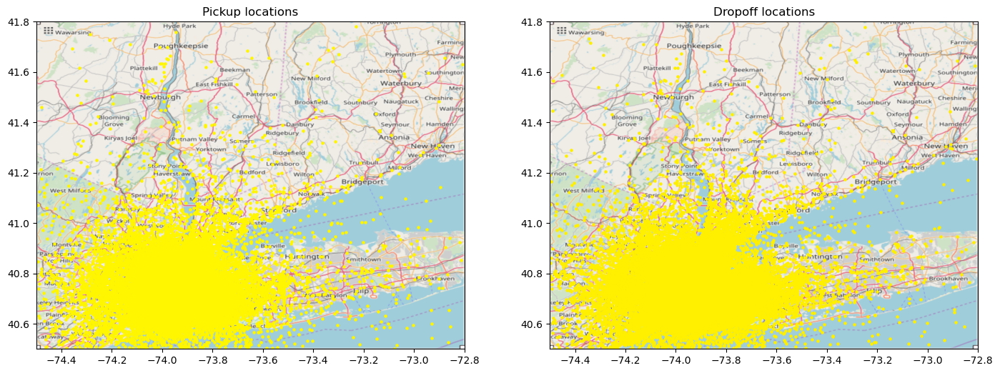

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO
import urllib.request
import ssl

# Disable SSL certificate verification
ssl._create_default_https_context = ssl._create_unverified_context

# Define the plot_on_map function 
def plot_on_map(data, BB, nyc_map, s=5, alpha=1.0):
    fig, axs = plt.subplots(1, 2, figsize=(17, 17)) 

    axs[0].scatter(data.pickup_longitude, data.pickup_latitude, zorder=1, alpha=alpha, c='#fff600', s=s)
    axs[0].set_xlim((BB[0], BB[1]))
    axs[0].set_ylim((BB[2], BB[3]))
    axs[0].set_title('Pickup locations')
    axs[0].imshow(nyc_map, zorder=0, extent=BB)

    axs[1].scatter(data.dropoff_longitude, data.dropoff_latitude, zorder=1, alpha=alpha, c='#fff000', s=s)
    axs[1].set_xlim((BB[0], BB[1]))
    axs[1].set_ylim((BB[2], BB[3]))
    axs[1].set_title('Dropoff locations')
    axs[1].imshow(nyc_map, zorder=0, extent=BB)

    plt.show()

# Load the NYC map image
url_nyc_map = 'https://aiblog.nl/download/nyc_-74.5_-72.8_40.5_41.8.png'
response_nyc_map = urllib.request.urlopen(url_nyc_map)
nyc_map = np.array(Image.open(BytesIO(response_nyc_map.read())))

# Define bounding box for New York City
BB = (-74.5, -72.8, 40.5, 41.8)

# Filter data within the bounding box
selected_data = data[
    (data.pickup_longitude >= BB[0]) & (data.pickup_longitude <= BB[1]) &
    (data.pickup_latitude >= BB[2]) & (data.pickup_latitude <= BB[3]) &
    (data.dropoff_longitude >= BB[0]) & (data.dropoff_longitude <= BB[1]) &
    (data.dropoff_latitude >= BB[2]) & (data.dropoff_latitude <= BB[3])
]

# Plot pickup and dropoff locations on the map
plot_on_map(selected_data, BB, nyc_map, s=5, alpha=1.0)



# The output is a visual representation of pickup and dropoff locations on the New York City map. 
# The red dots represent the locations of taxi pickups and dropoffs. 

In [22]:
data['pickup_datetime'] = pd.to_datetime(data['pickup_datetime'])


In [23]:
# Add time information
data['year'] = data['pickup_datetime'].dt.year
data['weekday'] = data['pickup_datetime'].dt.weekday
data['hour'] = data['pickup_datetime'].dt.hour


# Group by time features and calculate average fare amount
fare_by_year = data.groupby('year')['fare_amount'].mean()
fare_by_weekday = data.groupby('weekday')['fare_amount'].mean()
fare_by_hour = data.groupby('hour')['fare_amount'].mean()


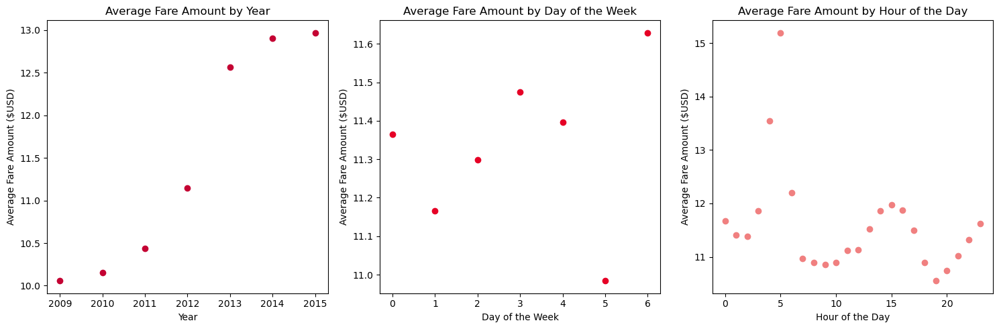

In [24]:
plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.scatter(fare_by_year.index, fare_by_year.values, c='#c40233', marker='o')
plt.xlabel('Year')
plt.ylabel('Average Fare Amount ($USD)')
plt.title('Average Fare Amount by Year')

plt.subplot(132)
plt.scatter(fare_by_weekday.index, fare_by_weekday.values, c='#e60026', marker='o')
plt.xlabel('Day of the Week')
plt.ylabel('Average Fare Amount ($USD)')
plt.title('Average Fare Amount by Day of the Week')

plt.subplot(133)
plt.scatter(fare_by_hour.index, fare_by_hour.values, c='lightcoral', marker='o')
plt.xlabel('Hour of the Day')
plt.ylabel('Average Fare Amount ($USD)')
plt.title('Average Fare Amount by Hour of the Day')

plt.tight_layout()
plt.show()


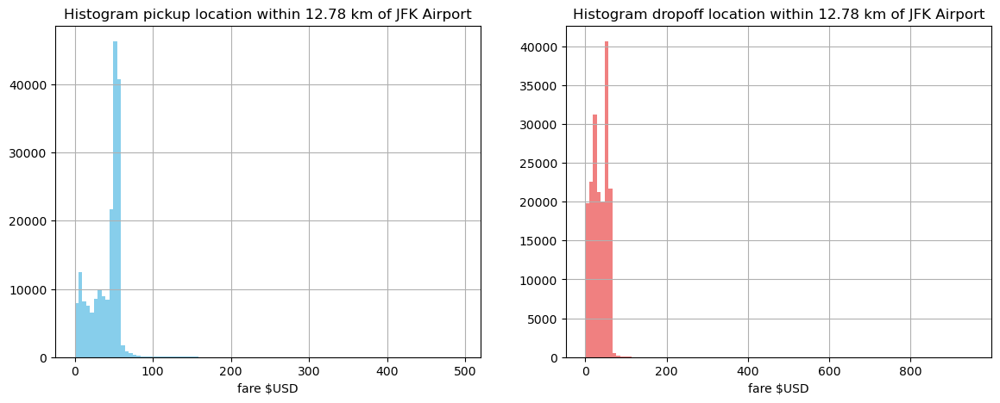

In [26]:
# JFK airport coordinates, see https://www.travelmath.com/airport/JFK
jfk = (-73.7822222222, 40.6441666667)
nyc = (-74.0063889, 40.7141667)

def plot_location_fare(loc, name, range=12.78):
    # select all datapoints with dropoff location within range of airport
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))
    idx = (distance(data.pickup_latitude,data.pickup_longitude, loc[1], loc[0]) < range)
    data[idx].fare_amount.hist(bins=100, ax=axs[0],color='skyblue')
    axs[0].set_xlabel('fare $USD')
    axs[0].set_title('Histogram pickup location within {} km of {}'.format(range, name))

    idx = (distance(data.dropoff_latitude, data.dropoff_longitude, loc[1], loc[0]) < range)
    data[idx].fare_amount.hist(bins=100, ax=axs[1],color='lightcoral')
    axs[1].set_xlabel('fare $USD')
    axs[1].set_title('Histogram dropoff location within {} km of {}'.format(range, name));
    
plot_location_fare(jfk, 'JFK Airport')

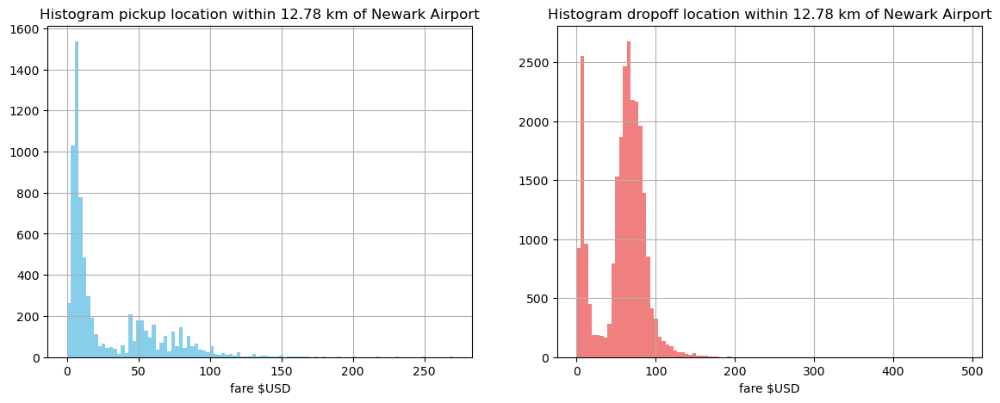

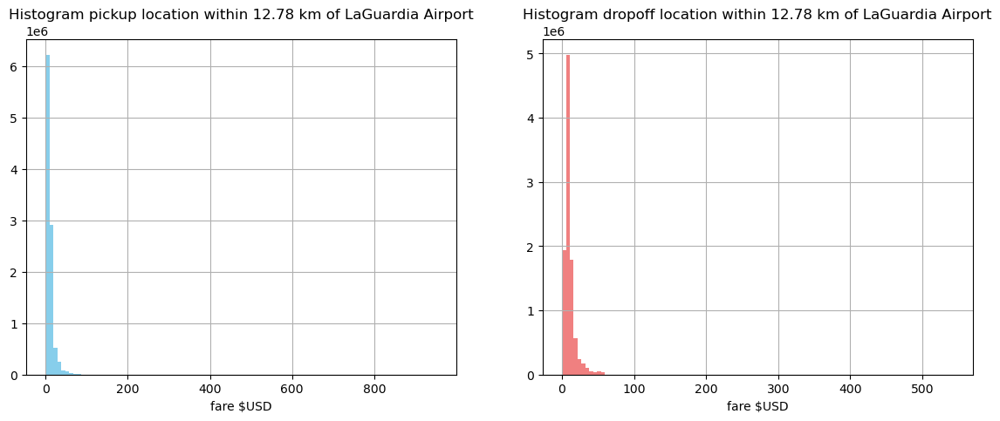

In [27]:
ewr = (-74.175, 40.69) # Newark Liberty International Airport, see https://www.travelmath.com/airport/EWR
lgr = (-73.87, 40.77) # LaGuardia Airport, see https://www.travelmath.com/airport/LGA
plot_location_fare(ewr, 'Newark Airport')
plot_location_fare(lgr, 'LaGuardia Airport')

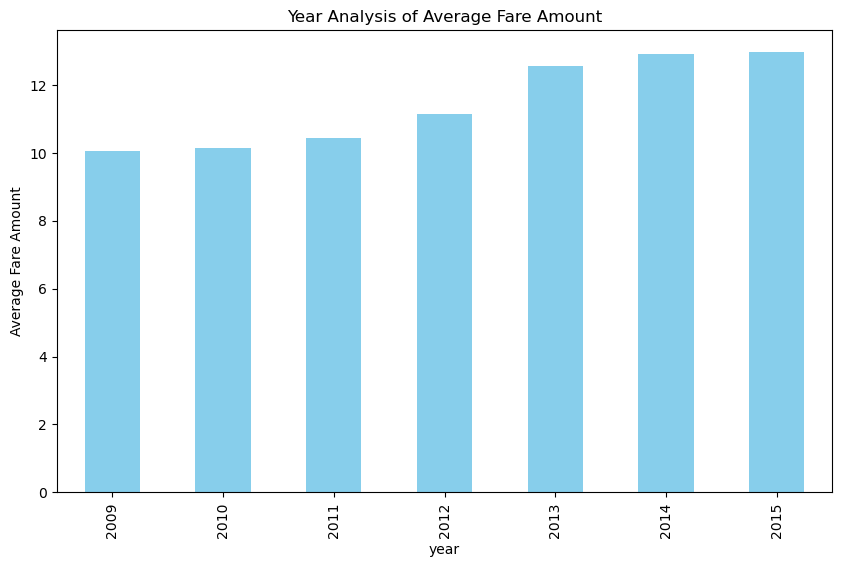

In [30]:
import pandas as pd
import matplotlib.pyplot as plt


data['pickup_datetime'] = pd.to_datetime(data['pickup_datetime'])

# Extract hour and day of the week
data['year'] = data['pickup_datetime'].dt.year

# Group by hour and calculate average fare amount
year_average_fare = data.groupby('year')['fare_amount'].mean()

# Plot the results
plt.figure(figsize=(10, 6))
year_average_fare.plot(kind='bar', color='skyblue')
plt.xlabel('year')
plt.ylabel('Average Fare Amount')
plt.title('Year Analysis of Average Fare Amount')
plt.show()


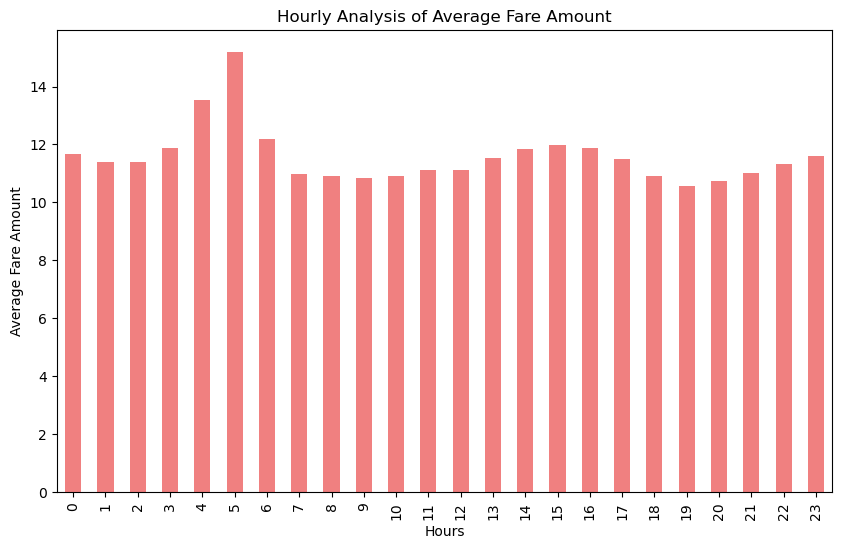

In [31]:
import pandas as pd
import matplotlib.pyplot as plt


data['pickup_datetime'] = pd.to_datetime(data['pickup_datetime'])

# Extract hour and day of the week
data['hour'] = data['pickup_datetime'].dt.hour

# Group by hour and calculate average fare amount
hourly_average_fare = data.groupby('hour')['fare_amount'].mean()

# Plot the results
plt.figure(figsize=(10, 6))
hourly_average_fare.plot(kind='bar', color='lightcoral')
plt.xlabel('Hours')
plt.ylabel('Average Fare Amount')
plt.title('Hourly Analysis of Average Fare Amount')
plt.show()

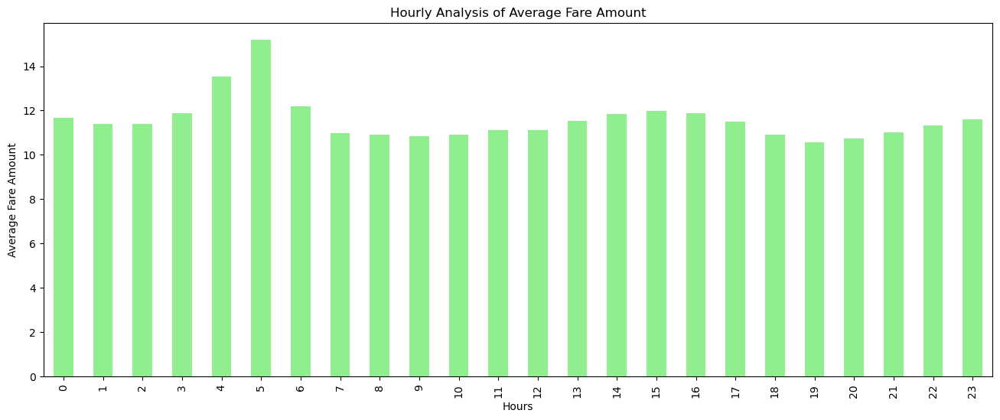

In [32]:
import pandas as pd
import matplotlib.pyplot as plt


data['pickup_datetime'] = pd.to_datetime(data['pickup_datetime'])

# Extract hour and day of the week
data['hour'] = data['pickup_datetime'].dt.hour

# Group by hour and calculate average fare amount
hourly_average_fare = data.groupby('hour')['fare_amount'].mean()

# Plot the results
plt.figure(figsize=(16, 6))
hourly_average_fare.plot(kind='bar',color='lightgreen')
plt.xlabel('Hours')
plt.ylabel('Average Fare Amount')
plt.title('Hourly Analysis of Average Fare Amount')
plt.show()

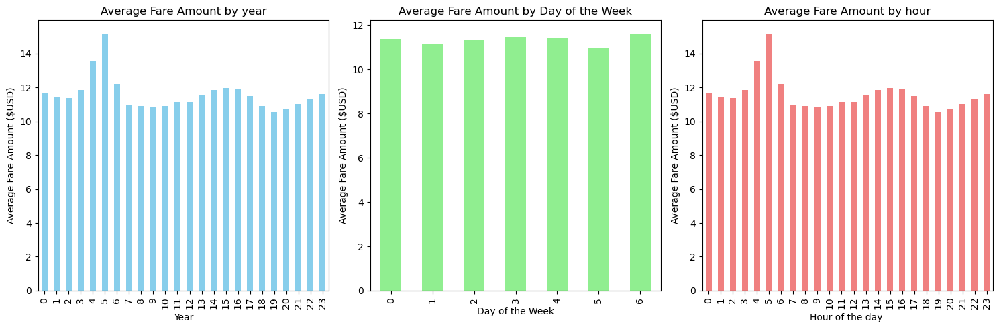

In [29]:
data['pickup_datetime'] = pd.to_datetime(data['pickup_datetime'])

# Extract time information

# Add time information
data['year'] = data['pickup_datetime'].dt.year
data['weekday'] = data['pickup_datetime'].dt.weekday
data['hour'] = data['pickup_datetime'].dt.hour


# Group by time features and calculate average fare amount
fare_by_year = data.groupby('year')['fare_amount'].mean()
fare_by_weekday = data.groupby('weekday')['fare_amount'].mean()
fare_by_hour = data.groupby('hour')['fare_amount'].mean()

# Visualize the results
plt.figure(figsize=(15, 5))

plt.subplot(131)
fare_by_hour.plot(kind='bar', color='skyblue')
plt.xlabel('Year')
plt.ylabel('Average Fare Amount ($USD)')
plt.title('Average Fare Amount by year')

plt.subplot(132)
fare_by_weekday.plot(kind='bar', color='lightgreen')
plt.xlabel('Day of the Week')
plt.ylabel('Average Fare Amount ($USD)')
plt.title('Average Fare Amount by Day of the Week')

plt.subplot(133)
fare_by_hour.plot(kind='bar', color='lightcoral')
plt.xlabel('Hour of the day ')
plt.ylabel('Average Fare Amount ($USD)')
plt.title('Average Fare Amount by hour')

plt.tight_layout()
plt.show()


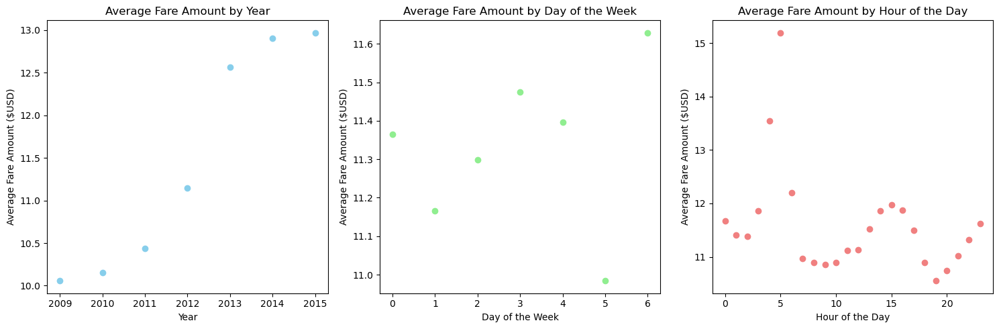

In [72]:
plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.scatter(fare_by_year.index, fare_by_year.values, color='#c40233', marker='o')
plt.xlabel('Year')
plt.ylabel('Average Fare Amount ($USD)')
plt.title('Average Fare Amount by Year')

plt.subplot(132)
plt.scatter(fare_by_weekday.index, fare_by_weekday.values, color='#e60026 ', marker='o')
plt.xlabel('Day of the Week')
plt.ylabel('Average Fare Amount ($USD)')
plt.title('Average Fare Amount by Day of the Week')

plt.subplot(133)
plt.scatter(fare_by_hour.index, fare_by_hour.values, color='lightcoral', marker='o')
plt.xlabel('Hour of the Day')
plt.ylabel('Average Fare Amount ($USD)')
plt.title('Average Fare Amount by Hour of the Day')

plt.tight_layout()
plt.show()


In [63]:
data['year']

0           2009
1           2010
2           2011
3           2012
4           2010
            ... 
11084765    2010
11084766    2014
11084768    2009
11084769    2014
11084770    2015
Name: year, Length: 10873712, dtype: int64

In [64]:
data['weekday']

0           0
1           1
2           3
3           5
4           1
           ..
11084765    0
11084766    6
11084768    1
11084769    2
11084770    1
Name: weekday, Length: 10873712, dtype: int64

In [65]:
data['hour']

0           17
1           16
2            0
3            4
4            7
            ..
11084765    19
11084766    22
11084768     8
11084769    22
11084770     8
Name: hour, Length: 10873712, dtype: int64

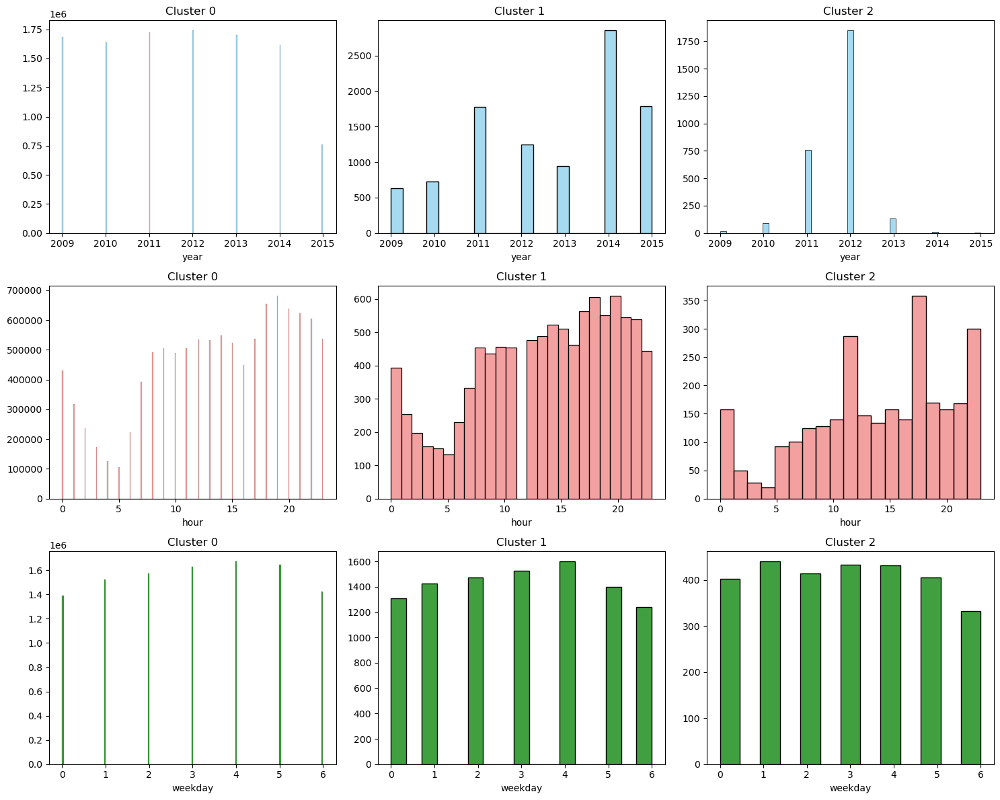

In [47]:
# Create subplots
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 12))

# Histograms for 'year' within each cluster
for i, cluster in enumerate(data['y'].unique()):
    subset = data[data['y'] == cluster]
    sns.histplot(subset['year'], kde=False, ax=axes[0, i], color='skyblue')
    axes[0, i].set_title(f'Cluster {cluster} ')
    axes[0, i].set_ylabel('')  # Remove count text on the y-axis

# Histograms for 'hour' within each cluster
for i, cluster in enumerate(data['y'].unique()):
    subset = data[data['y'] == cluster]
    sns.histplot(subset['hour'], kde=False, ax=axes[1, i], color='lightcoral')
    axes[1, i].set_title(f'Cluster {cluster}')
    axes[1, i].set_ylabel('')  # Remove count text on the y-axis

# Histograms for 'weekday' within each cluster
for i, cluster in enumerate(data['y'].unique()):
    subset = data[data['y'] == cluster]
    sns.histplot(subset['weekday'], kde=False, ax=axes[2, i], color='green')
    axes[2, i].set_title(f'Cluster {cluster}')
    axes[2, i].set_ylabel('')  # Remove count text on the y-axis

# Adjust layout
plt.tight_layout()
plt.show()


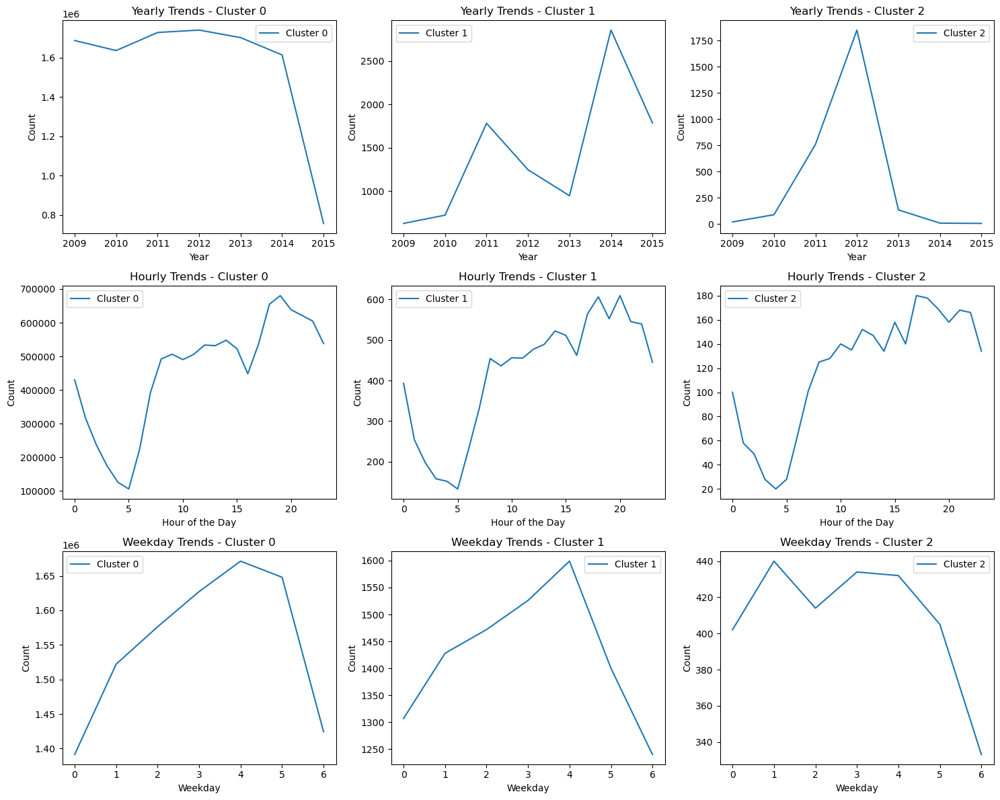

In [70]:
# Create subplots for each cluster
fig, axes = plt.subplots(nrows=3, ncols=len(data['y'].unique()), figsize=(15, 12))

# Line chart for 'year' trends within each cluster
for i, cluster in enumerate(data['y'].unique()):
    subset = data[data['y'] == cluster]
    yearly_trends = subset.groupby('year').size()
    yearly_trends.plot(ax=axes[0, i], label=f'Cluster {cluster}')
    axes[0, i].set_title(f'Yearly Trends - Cluster {cluster}')
    axes[0, i].set_xlabel('Year')
    axes[0, i].set_ylabel('Count')
    axes[0, i].legend()

# Line chart for 'hour' trends within each cluster
for i, cluster in enumerate(data['y'].unique()):
    subset = data[data['y'] == cluster]
    hourly_trends = subset.groupby('hour').size()
    hourly_trends.plot(ax=axes[1, i], label=f'Cluster {cluster}')
    axes[1, i].set_title(f'Hourly Trends - Cluster {cluster}')
    axes[1, i].set_xlabel('Hour of the Day')
    axes[1, i].set_ylabel('Count')
    axes[1, i].legend()

# Line chart for 'weekday' trends within each cluster
for i, cluster in enumerate(data['y'].unique()):
    subset = data[data['y'] == cluster]
    weekday_trends = subset.groupby('weekday').size()
    weekday_trends.plot(ax=axes[2, i], label=f'Cluster {cluster}')
    axes[2, i].set_title(f'Weekday Trends - Cluster {cluster}')
    axes[2, i].set_xlabel('Weekday')
    axes[2, i].set_ylabel('Count')
    axes[2, i].legend()

# Adjust layout
plt.tight_layout()
plt.show()


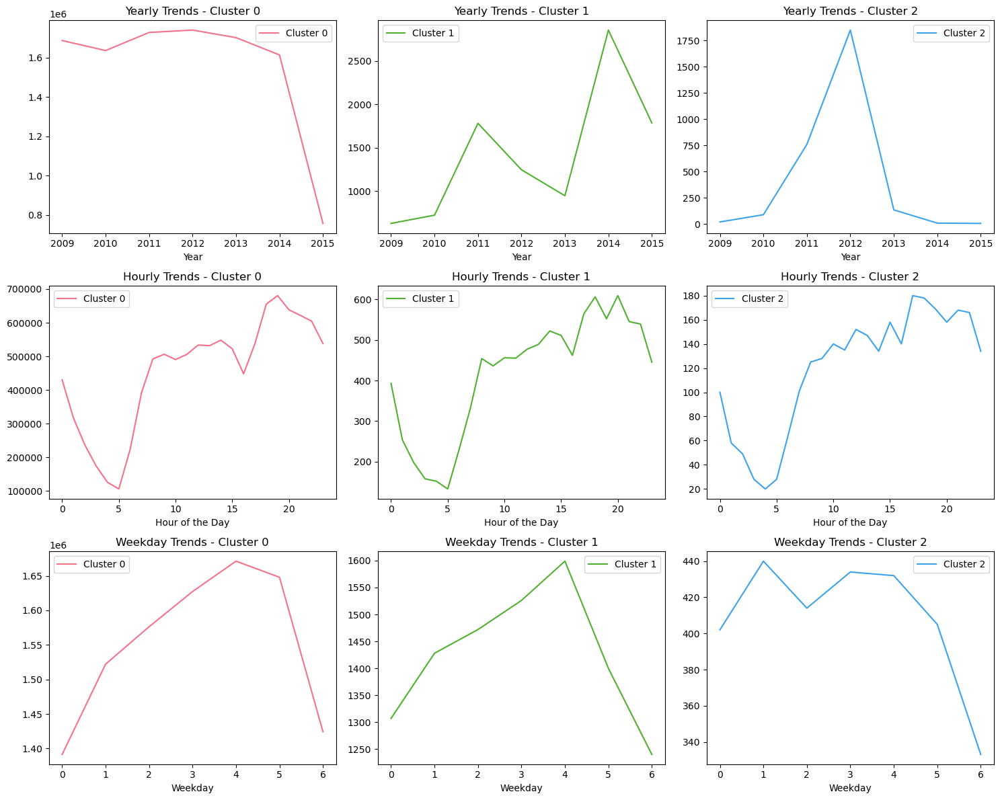

In [75]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define a color palette with as many colors as there are clusters
cluster_colors = sns.color_palette('husl', n_colors=len(data['y'].unique()))

# Create subplots for each cluster
fig, axes = plt.subplots(nrows=3, ncols=len(data['y'].unique()), figsize=(15, 12))

# Line chart for 'year' trends within each cluster
for i, cluster in enumerate(data['y'].unique()):
    subset = data[data['y'] == cluster]
    yearly_trends = subset.groupby('year').size()
    yearly_trends.plot(ax=axes[0, i], label=f'Cluster {cluster}', color=cluster_colors[i])
    axes[0, i].set_title(f'Yearly Trends - Cluster {cluster}')
    axes[0, i].set_xlabel('Year')
   
    axes[0, i].legend()

# Line chart for 'hour' trends within each cluster
for i, cluster in enumerate(data['y'].unique()):
    subset = data[data['y'] == cluster]
    hourly_trends = subset.groupby('hour').size()
    hourly_trends.plot(ax=axes[1, i], label=f'Cluster {cluster}', color=cluster_colors[i])
    axes[1, i].set_title(f'Hourly Trends - Cluster {cluster}')
    axes[1, i].set_xlabel('Hour of the Day')
    
    axes[1, i].legend()

# Line chart for 'weekday' trends within each cluster
for i, cluster in enumerate(data['y'].unique()):
    subset = data[data['y'] == cluster]
    weekday_trends = subset.groupby('weekday').size()
    weekday_trends.plot(ax=axes[2, i], label=f'Cluster {cluster}', color=cluster_colors[i])
    axes[2, i].set_title(f'Weekday Trends - Cluster {cluster}')
    axes[2, i].set_xlabel('Weekday')
  
    axes[2, i].legend()

# Adjust layout
plt.tight_layout()
plt.show()
